In [12]:
import matplotlib.pyplot as plt

In [ ]:
import cv2
images=[]
for i in range(1,41):
  for j in range(1,11):
    img = cv2.imread(f's{i}/{j}.pgm', cv2.IMREAD_GRAYSCALE)
    images.append(img)

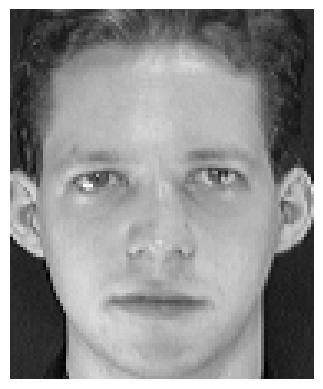

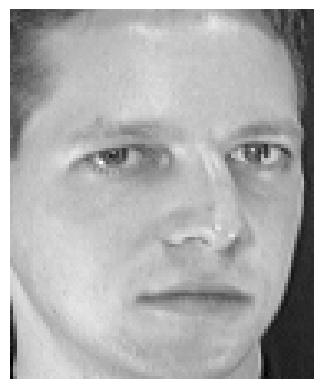

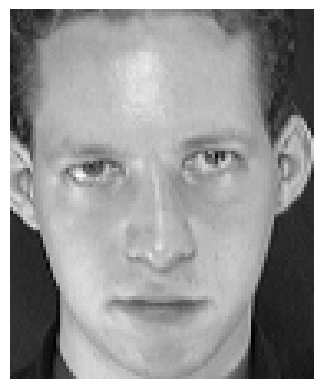

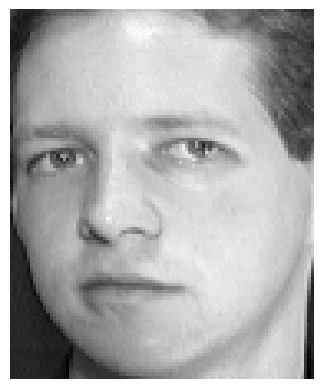

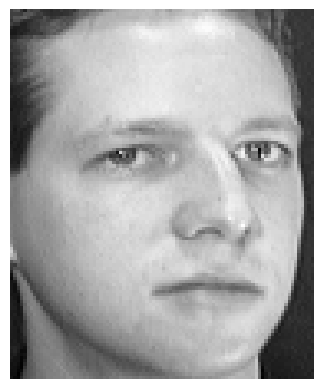

...

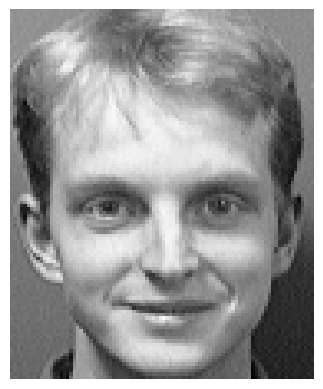

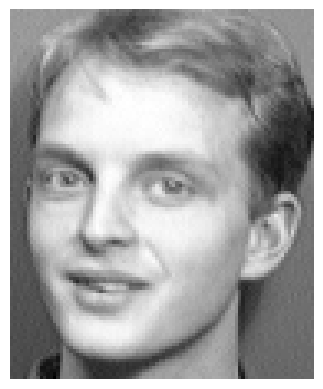

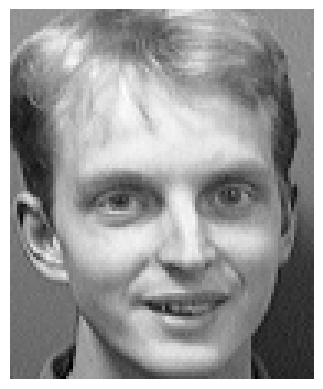

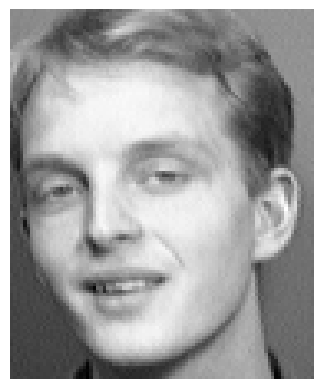

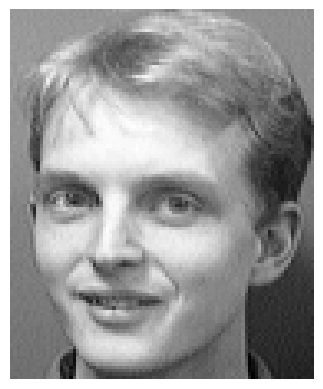

In [ ]:
for img in images:
  plt.imshow(img, cmap='gray')  

  plt.axis('off')  
  plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
H, W = 112, 92
D = H * W
assert len(images) == 400, "Expected 400 images (40 subjects × 10)."



In [ ]:
X_pixels = np.array([im.astype(np.float64).reshape(-1) for im in images])
y = np.repeat(np.arange(40), 10)

In [14]:
from sklearn.model_selection import train_test_split

Xtr_pix, Xte_pix, ytr, yte = train_test_split(
    X_pixels, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)


In [15]:
mu_pix = Xtr_pix.mean(axis=0)
std_pix = Xtr_pix.std(axis=0, ddof=1)

In [18]:
std_pix[std_pix < 1e-8] = 1.0

Xtr_std = (Xtr_pix - mu_pix) / std_pix
Xte_std = (Xte_pix - mu_pix) / std_pix

In [19]:
Xc = Xtr_std
N = Xc.shape[0]

In [20]:
L = (Xc @ Xc.T) / (N - 1)

In [21]:
eigvals, U = np.linalg.eigh(L)
idx_desc = np.argsort(eigvals)[::-1]
eigvals = eigvals[idx_desc]
U = U[:, idx_desc]

In [23]:
tol = 1e-12
pos = eigvals > tol
eigvals_pos = eigvals[pos]
U_pos = U[:, pos]
m = U_pos.shape[1]

In [24]:

V = (Xc.T @ U_pos) / np.sqrt((N - 1) * eigvals_pos[np.newaxis, :])


In [25]:
V /= np.linalg.norm(V, axis=0, keepdims=True)

In [26]:
def project_to_pca(X_std, V_k):
    # X_std: (n, D), V_k: (D, k) -> (n, k)
    return X_std @ V_k

In [27]:
def reconstruct_from_pca(coeffs, V_k, mu_pix, std_pix):
    # coeffs: (n, k), V_k: (D, k)
    X_std_hat = coeffs @ V_k.T
    X_pix_hat = X_std_hat * std_pix + mu_pix
    return X_pix_hat

In [28]:
def show_mean_and_eigenfaces(V, mu_pix, H=112, W=92, n_show=10):
    plt.figure(figsize=(10, 4))
    plt.subplot(1, n_show+1, 1)
    plt.imshow(mu_pix.reshape(H, W), cmap='gray')
    plt.title("Mean")
    plt.axis('off')
    for i in range(n_show):
        ef = V[:, i]
        ef_img = ef.reshape(H, W)
        # scale each eigenface for visualization (min-max)
        ef_img = (ef_img - ef_img.min()) / (ef_img.max() - ef_img.min() + 1e-12)
        plt.subplot(1, n_show+1, i+2)
        plt.imshow(ef_img, cmap='gray')
        plt.title(f"EF {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

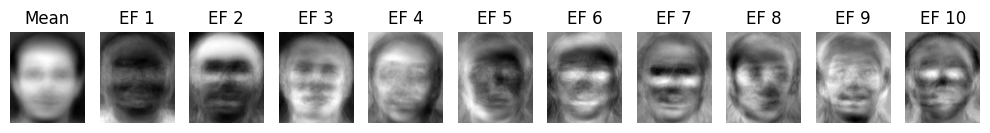

In [ ]:
show_mean_and_eigenfaces(V, mu_pix, H, W, n_show=10)


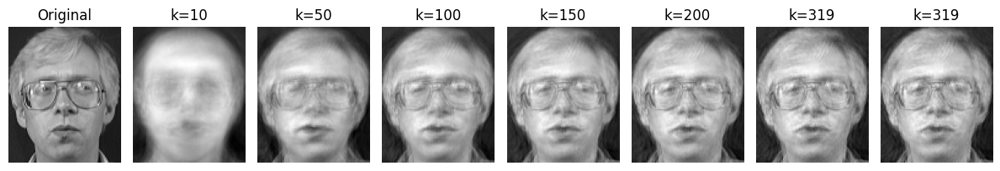

In [34]:
k_list_demo = [10, 50, 100, 150, min(200, m),min(500,m),min(1000,m)]
te_example = 0

plt.figure(figsize=(12, 3))
plt.subplot(1, len(k_list_demo)+1, 1)
plt.imshow(Xte_pix[te_example].reshape(H, W), cmap='gray')
plt.title("Original")
plt.axis('off')

for i, k in enumerate(k_list_demo, start=2):
    V_k = V[:, :k]
    coeffs_te = project_to_pca(Xte_std[te_example:te_example+1], V_k)
    Xhat = reconstruct_from_pca(coeffs_te, V_k, mu_pix, std_pix)
    rec = np.clip(Xhat[0], 0, 255).reshape(H, W)
    plt.subplot(1, len(k_list_demo)+1, i)
    plt.imshow(rec, cmap='gray')
    plt.title(f"k={k}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [35]:
def mse(a, b): return np.mean((a - b) ** 2)

for k in k_list_demo:
    V_k = V[:, :k]
    coeffs_te = project_to_pca(Xte_std[te_example:te_example+1], V_k)
    Xhat = reconstruct_from_pca(coeffs_te, V_k, mu_pix, std_pix)
    print(f"[Example idx {te_example}] k={k:>3}  MSE={mse(Xte_pix[te_example], Xhat[0]):.3f}")

[Example idx 0] k= 10  MSE=697.642
[Example idx 0] k= 50  MSE=362.161
[Example idx 0] k=100  MSE=308.876
[Example idx 0] k=150  MSE=284.967
[Example idx 0] k=200  MSE=270.927
[Example idx 0] k=319  MSE=256.571
[Example idx 0] k=319  MSE=256.571



Accuracy vs k
k=  5 -> accuracy=86.25%
k= 10 -> accuracy=93.75%
k= 20 -> accuracy=93.75%
k= 30 -> accuracy=95.00%
k= 40 -> accuracy=95.00%
k= 50 -> accuracy=95.00%
k= 75 -> accuracy=95.00%
k=100 -> accuracy=93.75%
k=125 -> accuracy=95.00%
k=150 -> accuracy=95.00%
k=175 -> accuracy=95.00%
k=200 -> accuracy=95.00%

Avg Reconstruction MSE vs k (test set)
k=  5 -> MSE=825.150
k= 10 -> MSE=659.253
k= 20 -> MSE=530.859
k= 30 -> MSE=474.178
k= 40 -> MSE=430.469
k= 50 -> MSE=402.514
k= 75 -> MSE=357.763
k=100 -> MSE=332.271
k=125 -> MSE=315.499
k=150 -> MSE=303.212
k=175 -> MSE=293.360
k=200 -> MSE=285.073


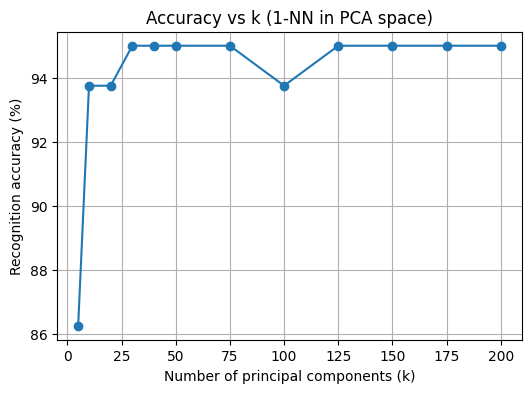

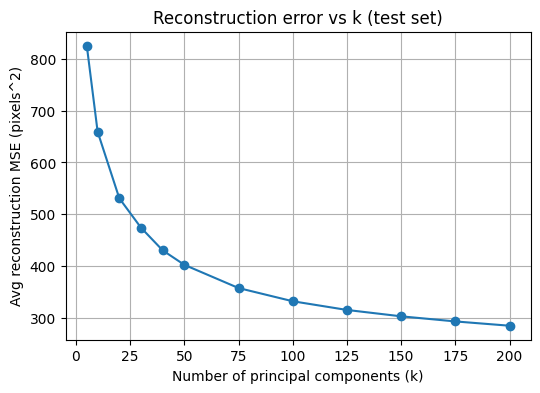

In [36]:
k_list = [5, 10, 20, 30, 40, 50, 75, 100, 125, 150, min(175, m), min(200, m)]
acc_list = []
mse_list = []

for k in k_list:
    V_k = V[:, :k]

    Ztr = project_to_pca(Xtr_std, V_k)
    Zte = project_to_pca(Xte_std, V_k)

    ypred = nn1_predict(Ztr, ytr, Zte)
    acc = np.mean(ypred == yte)
    acc_list.append(acc)


    Xhat_te = reconstruct_from_pca(Zte, V_k, mu_pix, std_pix)
    mse_avg = np.mean((Xte_pix - Xhat_te) ** 2)
    mse_list.append(mse_avg)

print("\nAccuracy vs k")
for k, a in zip(k_list, acc_list):
    print(f"k={k:>3} -> accuracy={a*100:5.2f}%")

print("\nAvg Reconstruction MSE vs k (test set)")
for k, e in zip(k_list, mse_list):
    print(f"k={k:>3} -> MSE={e:.3f}")

# Plots
plt.figure(figsize=(6,4))
plt.plot(k_list, np.array(acc_list)*100, marker='o')
plt.xlabel("Number of principal components (k)")
plt.ylabel("Recognition accuracy (%)")
plt.title("Accuracy vs k (1-NN in PCA space)")
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4))
plt.plot(k_list, mse_list, marker='o')
plt.xlabel("Number of principal components (k)")
plt.ylabel("Avg reconstruction MSE (pixels^2)")
plt.title("Reconstruction error vs k (test set)")
plt.grid(True)
plt.show()